# <div style="text-align: center"> Gradient Descent </div>

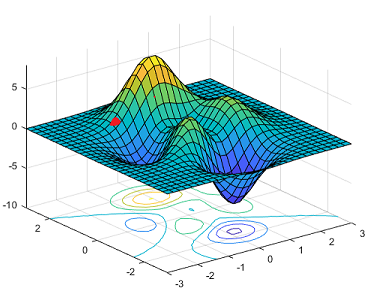

# Outlines
* Problem
* What is Gradient Descent?
* How Gradian Descent Works?
* Mean Square Error
* Python code for implementing Gradient Descent

<div style="text-align: justify">if x=[1,2,3,4,5]  & y=2x+3 so  y=[5,7,9,11,13]
However, in machine learning problem we have obsevation or training dataset which is an input and output like: x & y using that you can drive an equation. Also known as prediction function as a result you can use y=2x+3 to predict the future value of x.
    </div>

# Problem:
<div style="text-align: justify">How can you drive this equation price = 135.78*are + 180616.43 give this dataset
    are=[3600,3000,3200,3600,4000] price=[550k,565k,610k,680k,725k]? That equation is the best fit line going through all datapoints. 
    </div>

**The problem here you might have so many lines. How do you know which line is the best fit line?**
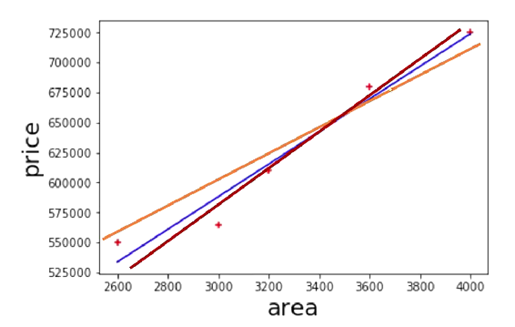

<div style="text-align: justify">
    One way is you draw any random line then from your actual data point you calculate the error between that datapoint the datapoint predicted by your line. So call it the delta. You collect all this deltas and square them. The reason you want to square them is this deltas could also be negative. Then, you sum them up and divided by n. Here n is 5. It is the number of datapoints that is available. The result is called Mean Squared Error (MSE).
    </div>

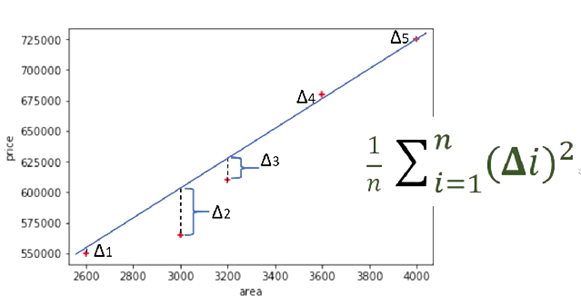

**This MSE is also called a cost function.**

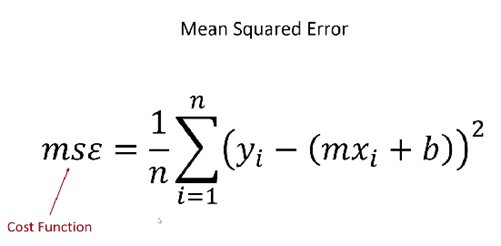

# What is Grasient Descent?

<div style="text-align: justify"> 
   Gradient descent is an algorithm that finds best fit line for given training data set. Gradient descent is a first-order iterative optimization algorithm for finding a local minimum of a differentiable function. The idea is to take repeated steps in the opposite direction of the gradient (or approximate gradient) of the function at the current point, because this is the direction of steepest descent. </div>

# How Gradient Descent works?

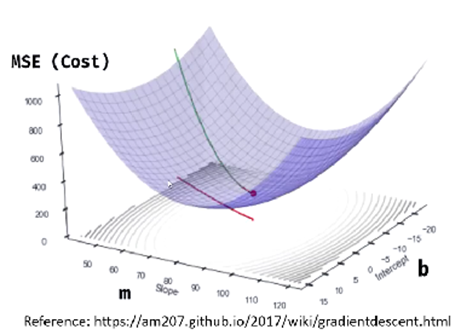

<div style="text-align: justify">
Figure above plotted MSE versus different values of m & b. Start with some value of m & b (usually 0). From that point you calculate the cost for example the cost is 100. Then you reduce the valuse of m & b by some amount (Learning rate we talk about this later). By taking this step the error is reduced keep on taking this steps until you reack your minima. Here error is minimum. Once you reach that you have found your answer. 
    </div>

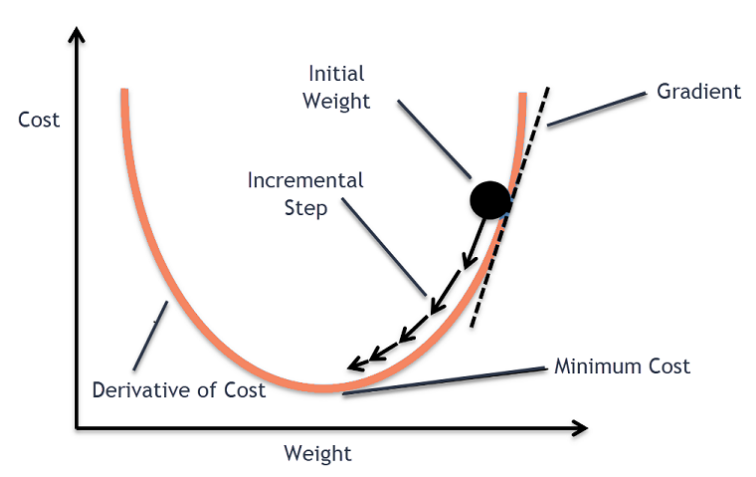

# What if we take fix size steps for b?

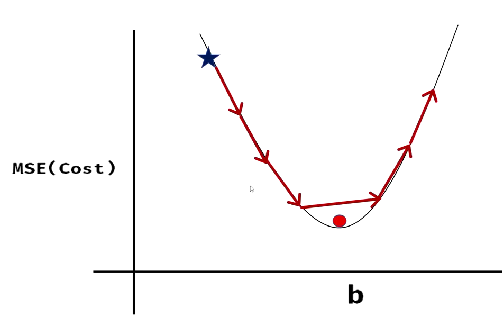

**By taking fix step I might missed the global minima.**

# The better approcah

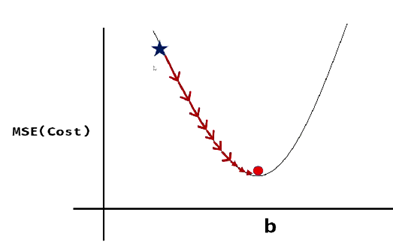

<div style="text-align: justify">
This can work. Here in each step I am following the curvature of my chart and also as I reach near the red point the step size is reducing. How can I do that? at each point you need to calculate the slope. Once I have a slop I know which direction I need to go in. There is something called a learning rate which you can use in cunjunction with this slope here to take that step and reach the next point.
    </div>

# MSE and partial derivatives of m & b

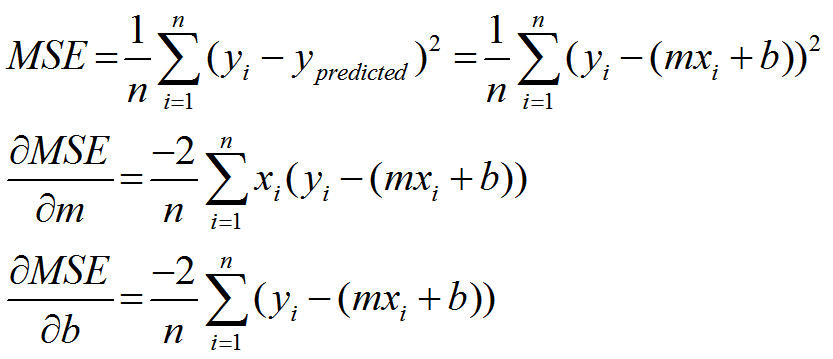

**Once you have partial derivative you have your slope. Now you need to take step for step you use something called learning rate.**

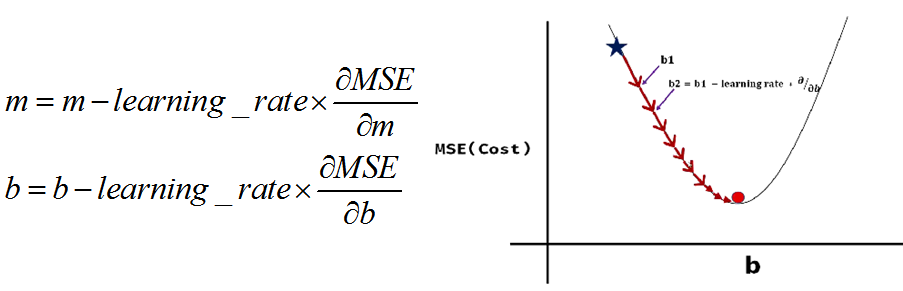

# Python code for implementing Gradient Descent:

In [14]:
import numpy as np

In [15]:
def gradient_descent(x,y):
    m_curr=b_curr=0
    n=len(x)
    iterations = 100000
    learning_rate = 0.08
    for i in range(iterations):
        y_predicted = m_curr * x + b_curr
        cost = (1/n)*sum([val**2 for val in (y-y_predicted)])
        m_d = -(2/n)*sum(x*(y-y_predicted))
        b_d = (2/n)*sum(-(y-y_predicted))
        m_curr = m_curr - learning_rate * m_d
        b_curr = b_curr - learning_rate * b_d
        print("m{}, b{}, cost{} ,iteration {}".format(m_curr,b_curr,cost,i))
        

In [16]:
x= np.array([1,2,3,4,5])
y=np.array([5,7,9,11,13])

In [17]:
gradient_descent(x,y)

m4.96, b1.44, cost89.0 ,iteration 0
m0.4991999999999983, b0.26879999999999993, cost71.10560000000002 ,iteration 1
m4.451584000000002, b1.426176000000001, cost56.8297702400001 ,iteration 2
m0.892231679999997, b0.5012275199999995, cost45.43965675929613 ,iteration 3
m4.041314713600002, b1.432759910400001, cost36.35088701894832 ,iteration 4
m1.2008760606719973, b0.7036872622079998, cost29.097483330142282 ,iteration 5
m3.7095643080294423, b1.4546767911321612, cost23.307872849944438 ,iteration 6
m1.4424862661541864, b0.881337636696883, cost18.685758762535738 ,iteration 7
m3.4406683721083144, b1.4879302070713722, cost14.994867596913156 ,iteration 8
m1.6308855378034224, b1.0383405553279617, cost12.046787238456794 ,iteration 9
m3.2221235247119777, b1.5293810083298451, cost9.691269350698109 ,iteration 10
m1.7770832372205707, b1.1780607551353204, cost7.8084968312098315 ,iteration 11
m3.0439475772474127, b1.5765710804477953, cost6.302918117062937 ,iteration 12
m1.8898457226770244, b1.3032248704973

# Excersie:

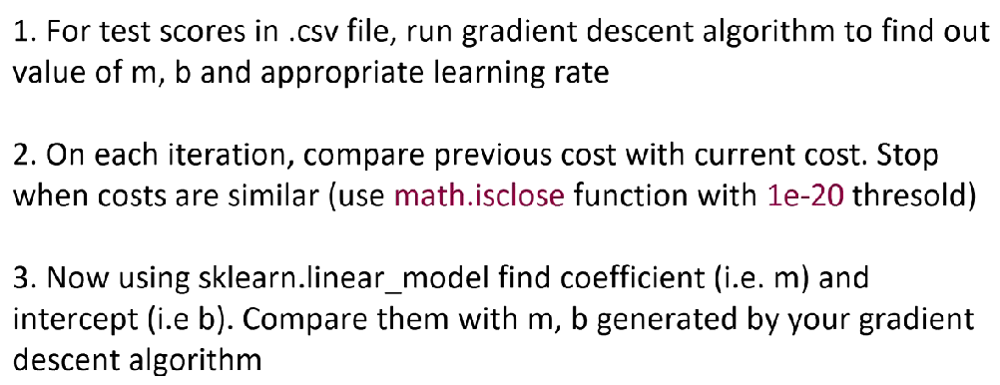

In [1]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
import math

In [3]:
df = pd.read_csv('D:/Data_Science/My Github/Machine-Learning-with-Python/3. Gradient Descent/Exercise/test_scores.csv')
df.head()

,name,math,cs
0,david,92,98
1,laura,56,68
2,sanjay,88,81
3,wei,70,80
4,jeff,80,83


In [4]:
r = LinearRegression()
r.fit(df[['math']],df.cs)

LinearRegression()

In [8]:
def gradient_descent(x,y):
    m_curr=b_curr=0
    n=len(x)
    iterations = 100000
    learning_rate = 0.0001
    cost_previous = 0
    
    for i in range(iterations):
        y_predicted = m_curr * x + b_curr
        cost = (1/n)*sum([val**2 for val in (y-y_predicted)])
        m_d = -(2/n)*sum(x*(y-y_predicted))
        b_d = (2/n)*sum(-(y-y_predicted))
        m_curr = m_curr - learning_rate * m_d
        b_curr = b_curr - learning_rate * b_d
        if math.isclose(cost,cost_previous, rel_tol=1e-20):
            break
        cost_previous = cost
                
        print("m{}, b{}, cost{} ,iteration {}".format(m_curr,b_curr,cost,i))
        
    return m_curr, b_curr
        

In [10]:
x = np.array(df.math)
y=np.array(df.cs)
m,b = gradient_descent(x,y)
print("Using Gradient Descent Function: m={}, b={}".format(m,b))
print("Using sklearn: m={}, b={}".format(r.coef_,r.intercept_))

m0.9891800000000002, b0.013980000000000001, cost5199.1 ,iteration 0
m1.0416176032, b0.0147417592, cost46.3330473650399 ,iteration 1
m1.0443971065873279, b0.014802799669408, cost31.852649863558305 ,iteration 2
m1.0445441606668626, b0.014826693765467417, cost31.811952059367805 ,iteration 3
m1.0445516647187705, b0.014848618440205038, cost31.811832943358482 ,iteration 4
m1.0445517710206773, b0.014870438475874223, cost31.81182786237329 ,iteration 5
m1.0445514851602624, b0.0148922527273428, cost31.811823101960222 ,iteration 6
m1.0445511785140886, b0.014914066435056226, cost31.81181834255699 ,iteration 7
m1.0445508707693771, b0.01493587987682099, cost31.811813583265543 ,iteration 8
m1.0445505629697767, b0.014957693067366749, cost31.811808824083364 ,iteration 9
m1.044550255170612, b0.014979506007477059, cost31.811804065010467 ,iteration 10
m1.0445499473748168, b0.015001318697196186, cost31.81179930604682 ,iteration 11
m1.0445496395825458, b0.015023131136529195, cost31.811794547192434 ,iteratio

|  Algorithm |  m | b  |
|------------|----|----|
| Gradien Descent| 1.02   | 1.31   |
| Sklearn | 1.01   | 1.91   |




|  Date |  Author |   |   |
|---|---|---|---|
| 2021-08-22    |   <font color=blue>**Ehsan Zia**</font>  |  |  |

